## ICE-6 Color features and histogram
Please download the following images for the ICE-6:<br>
https://drive.google.com/file/d/136KacYJQZ3ShMSDndqgzohTlTPrfKuma/view?usp=sharing

In [1]:
!apt install subversion
!svn checkout https://github.com/chakravarthulaharsha/feature_engineering

Reading package lists... Done
Building dependency tree       
Reading state information... Done
subversion is already the newest version (1.9.7-4ubuntu1.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 12 not upgraded.
Checked out revision 9.


## (Tutorial) Dominant colors
Please refer to the following link to learn how to extract dominant colors of a given image:<br>
https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/

## Example 1. Extracting dominant colors

In [2]:
# import the necessary packages
!pip install utils
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import argparse
import utils
import cv2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


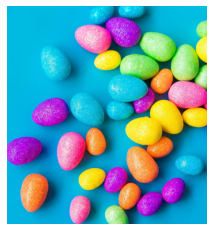

In [3]:
# load the image and convert it from BGR to RGB so that
# we can dispaly it with matplotlib
image = cv2.imread("/content/feature_engineering/trunk/images/eggs.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.axis("off")
plt.imshow(image)

In [4]:
# reshape the image to proper version for the following processing
image = image.reshape((image.shape[0] * image.shape[1], 3))

In [5]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 10)
clt.fit(image)

KMeans(n_clusters=10)

In [6]:
# import the necessary packages
import numpy as np
import cv2
def centroid_histogram(clt):
# grab the number of different clusters and create a histogram
# based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
# normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
# return the histogram
    return hist

In [7]:
def plot_colors(hist, centroids):
# initialize the bar chart representing the relative frequency
# of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
# loop over the percentage of each cluster and the color of
# each cluster
    for (percent, color) in zip(hist, centroids):
# plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv2.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

# return the bar chart
    return bar

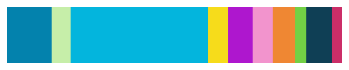

In [8]:
# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

## (Tutorial) Within-Cluster Sum of Square (wcss) and Elbow method
Please refer to the following link to learn Elbow method for optimal number of clusters selecting:<br>
https://www.analyticsvidhya.com/blog/2021/01/in-depth-intuition-of-k-means-clustering-algorithm-in-machine-learning/

## Task 1. Using the Elbow method to select the optimal number of clusters for the three images in your downloaded zip file
1. Selecting the optimal number of clusters using Elbow method
2. Visualizing the histogram of clusters as shown in example 1 with the optimal number of clusters

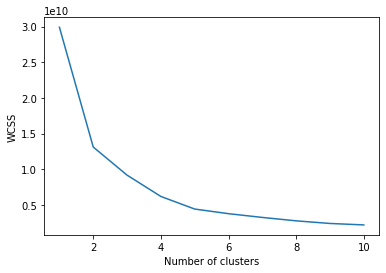

In [9]:
# write you code here
from sklearn.cluster import KMeans
wcss = [] 
for i in range(1, 11): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(image) 
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1, 11), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') 
plt.show()


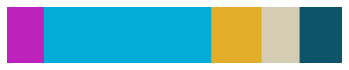

In [10]:
# cluster the pixel intensities
clt = KMeans(n_clusters = 5)
clt.fit(image)

# build a histogram of clusters and then create a figure
# representing the number of pixels labeled to each color
hist = centroid_histogram(clt)
bar = plot_colors(hist, clt.cluster_centers_)
# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.savefig('/content/feature_engineering/trunk/images/histogram.png')
plt.show()

## Question 1. According to the Elbow method, how to choose the optimal number of clusters?

**Answer to Q1**: The optimal number of clusters is found as the number of clusters at which an elbow shape is formed.


---

## (Tutorial) Histogram Equalization
Please refer to the following link to learn the histogram equalization:<br>
https://medium.com/@kyawsawhtoon/a-tutorial-to-histogram-equalization-497600f270e2 <br> and 
https://hypjudy.github.io/2017/03/19/dip-histogram-equalization/

## Example 2. Histogram equalization on gray image

Original Image


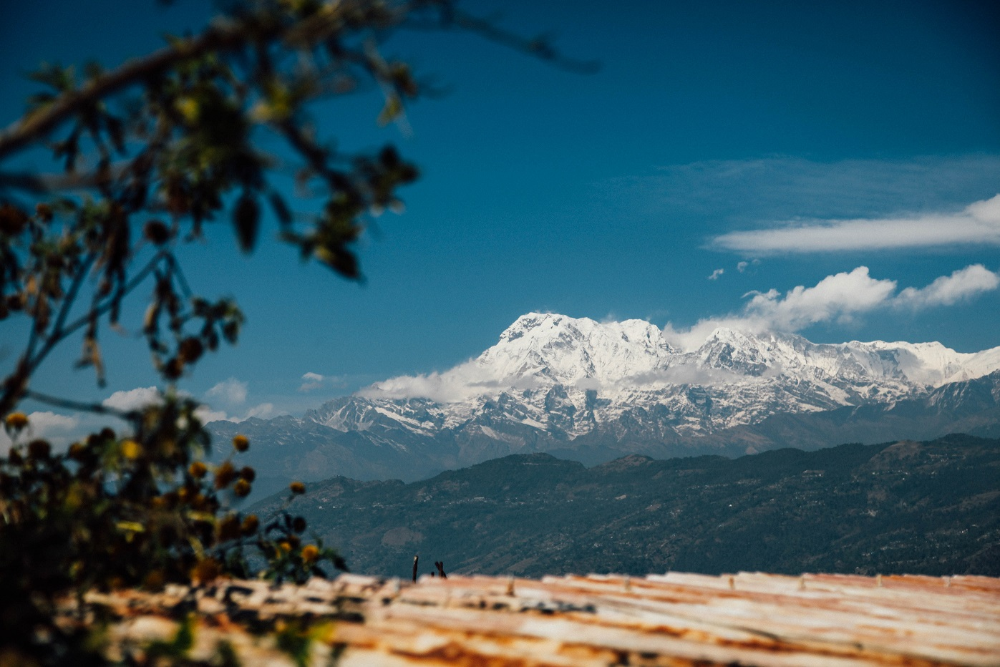

Gray Image


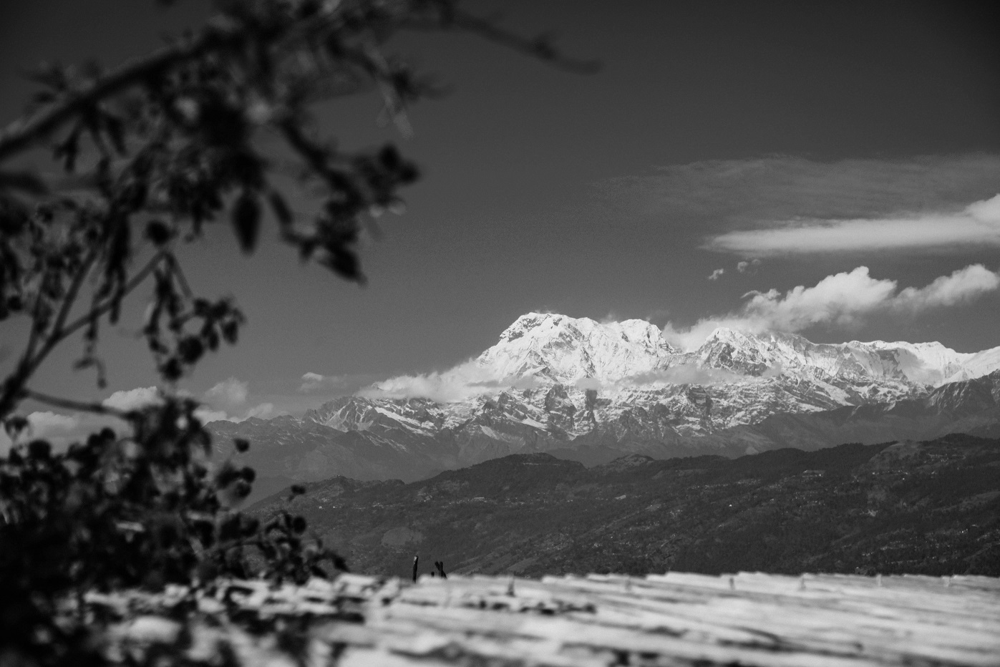

In [11]:
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/feature_engineering/trunk/images/Nepal.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
print("Original Image")
cv2_imshow(img)
print("Gray Image")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

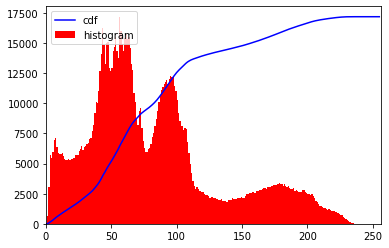

In [12]:
hist,bins = np.histogram(gray.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(gray.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

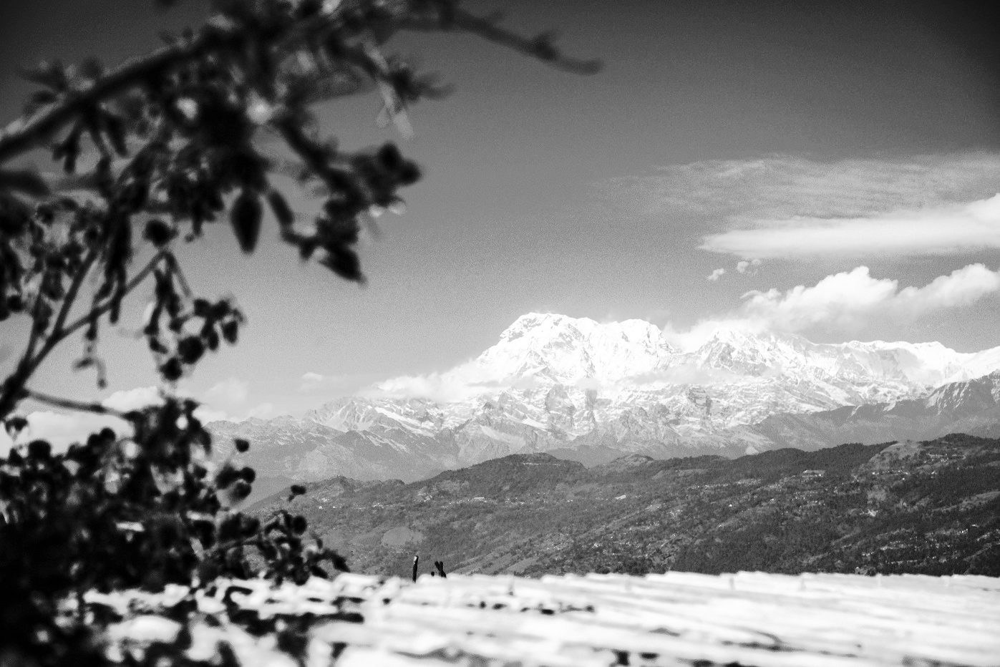

In [13]:
equ = cv2.equalizeHist(gray)
cv2_imshow(equ)
cv2.waitKey(0)
cv2.destroyAllWindows()

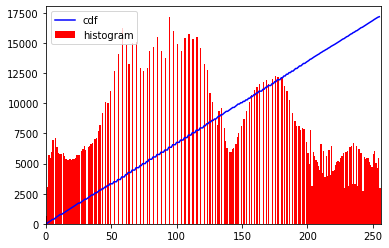

In [14]:
hist,bins = np.histogram(equ.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()



```
# This is formatted as code
```

## Task 2. Histogram equalization on color images
1. Apply histogram equalization on the 3 downloaded images
2. Visualize the histograms and the cumulative summation before and after histogram equalization
3. Show the images before and after histogram equalization

Original Image


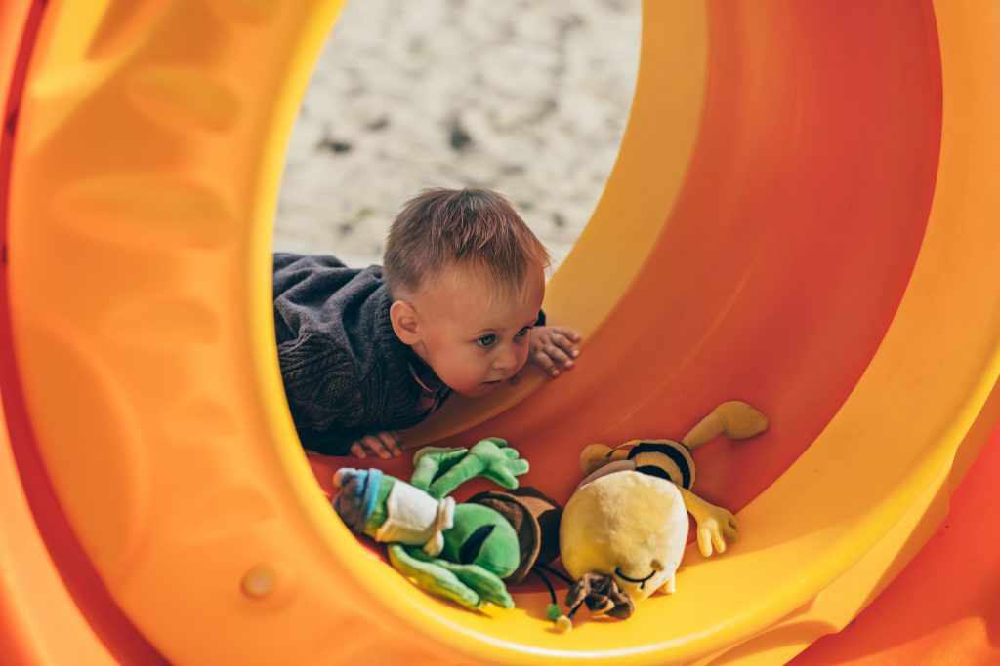


Gray Map


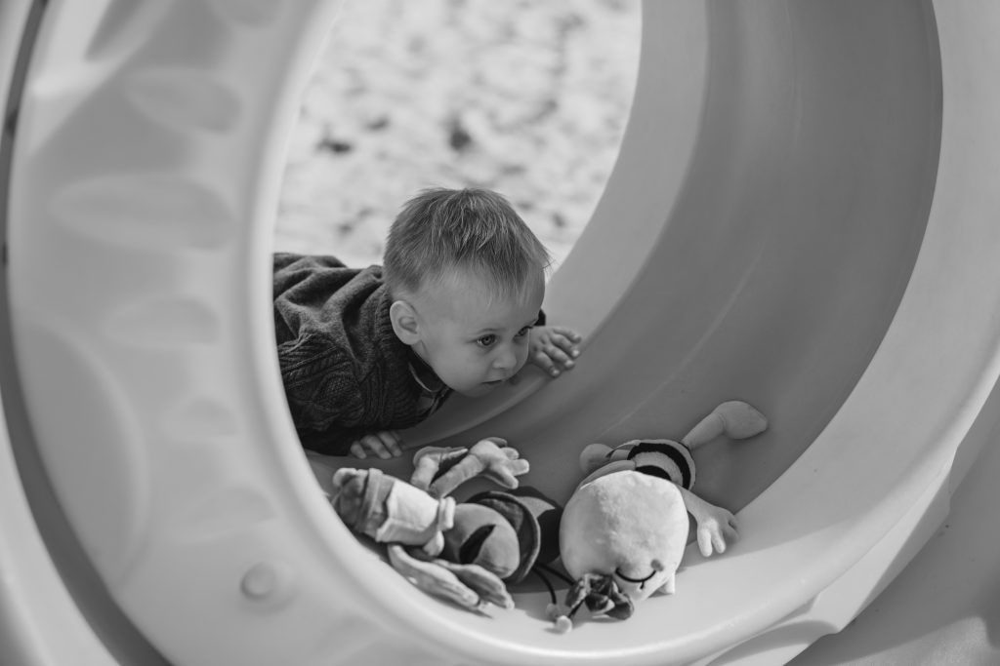

In [15]:
# write your code here

img = cv2.imread('/content/feature_engineering/trunk/images/boy.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2.imwrite('/content/feature_engineering/trunk/images/boyorig_imagebefore.png',img)
cv2.imwrite('/content/feature_engineering/trunk/images/boyimage_greybefore.png',gray)
print("Original Image")
cv2_imshow(img)
print("\nGray Map")
cv2_imshow(gray)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Question 2. Why don't we apply histogram equalization on each color channel separately to implement histogram equalization on color images?



```
# This is formatted as code
```

**Answer to Q2**: Equalizing histograms is a non-linear procedure. It's a poor idea to separate and modify each channel separately. The intensity measurements, not the color components, are used to equalize images. As a result, histogram equalization cannot be used on RGB color photos directly. Without changing the intensity values, a color balance must be maintained.


## Task 3. Convert RGB image to Ycbcr from opencv 

Use any rgb image and share it from your google drive as shareable link and use it here 

Original Image


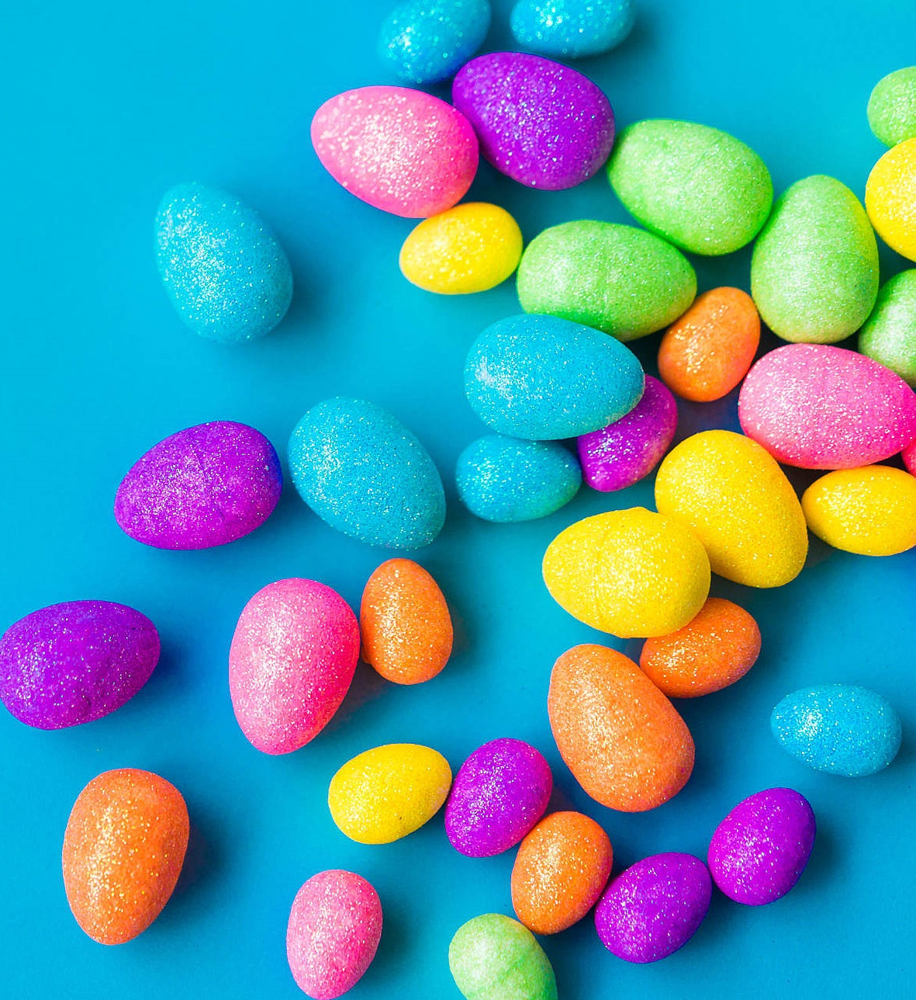

\Ycbcr


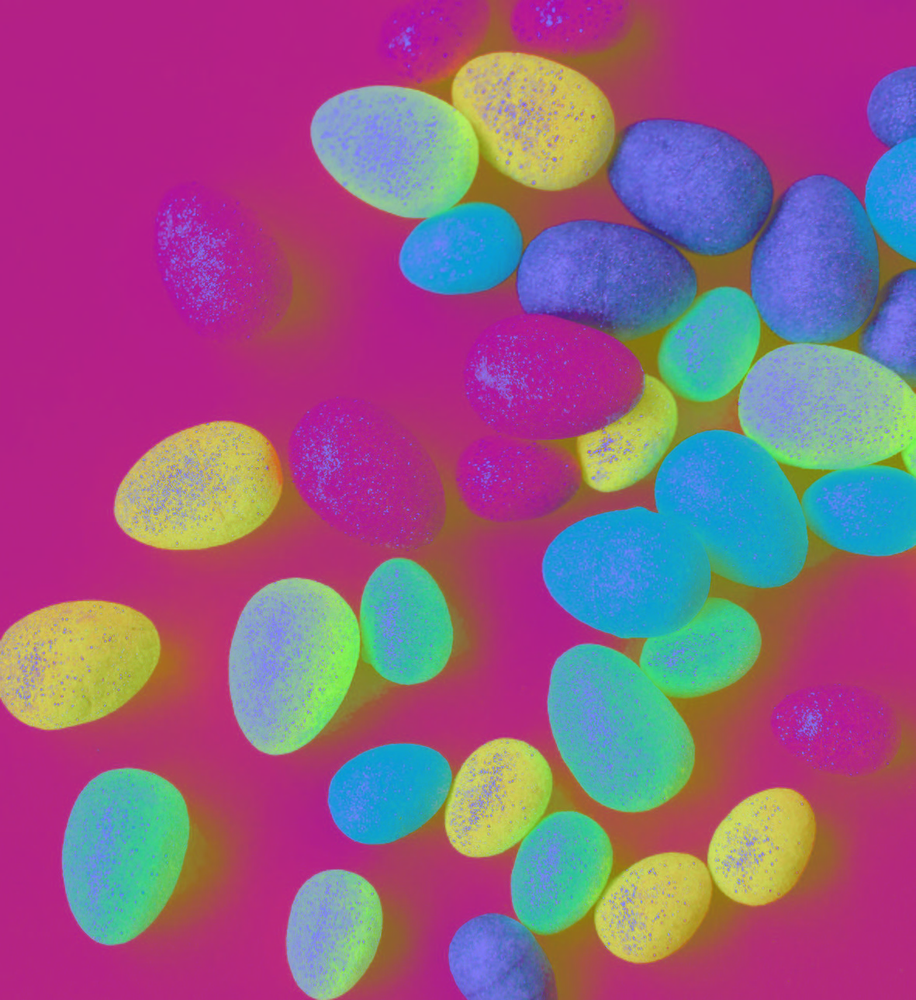

In [16]:
#code here
img = cv2.imread('/content/feature_engineering/trunk/images/eggs.jpg')
imgYCC = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)
cv2.imwrite('/content/feature_engineering/trunk/images/eggimage_Ycbcrbefore.png',gray)
print("Original Image")
cv2_imshow(img)
print("\Ycbcr")
cv2_imshow(imgYCC)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Task 4. Design code to implement Features from Accelerated Segment Test (FAST)

Keep your face image file name as **faceimg.jpg**
Save it in drive and use get shareable link to everyone option.

Please print the following during the implementation

* Original Image (faceimg.jpg)

* Gray Image (of original image)

* Number of Keypoints Detected In The Image With Non Max Suppression (Not just number image too)

* Number of Keypoints Detected In The Image Without Non Max Suppression (Not just number image too)


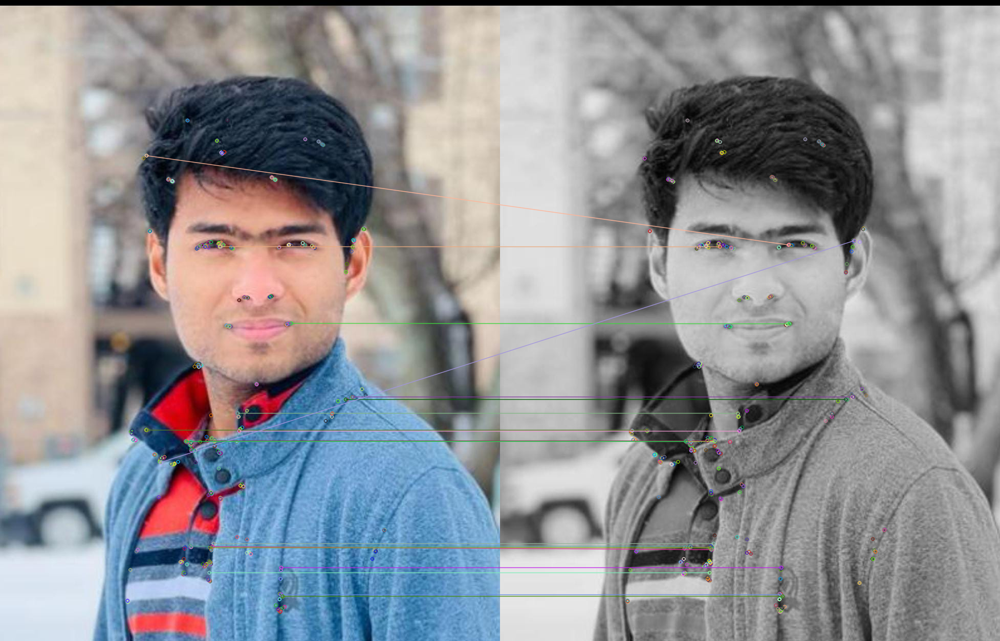

-1

In [17]:
from skimage.util import img_as_float32
## Code here 
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
Testimg= cv2.imread('/content/feature_engineering/trunk/ICE_5/faceimg1.jpeg')
gray = cv2.cvtColor(Testimg, cv2.COLOR_BGR2GRAY)
cv2.imwrite('/content/feature_engineering/trunk/ICE_5/faceimg1_grey.jpeg',gray)
TrainImg= cv2.imread('/content/feature_engineering/trunk/ICE_5/faceimg1_grey.jpeg')
test_img_g= cv2.cvtColor(Testimg,cv2.COLOR_BGR2GRAY)
train_img_g= cv2.cvtColor(TrainImg, cv2.COLOR_BGR2GRAY)

# algorithm
ORB= cv2.ORB_create()

test_keypoints, test_Desc = ORB.detectAndCompute(test_img_g,None)
train_keypoints, train_Desc = ORB.detectAndCompute(train_img_g,None)

# Initialize the Matcher for matching
matcher = cv2.BFMatcher()
matches = matcher.match(test_Desc,train_Desc)


img_f= cv2.drawMatches(Testimg, test_keypoints,
TrainImg, train_keypoints, matches[:20],None)

img_as_float32 = cv2.resize(img_f, (1000,650))

# Show the final image
cv2_imshow(img_f)
cv2.waitKey(3000)


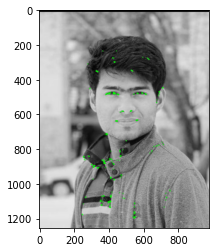

The Number of keypoints in Train Image : 500


In [18]:
import numpy as np#For faceimg1
import cv2 as cv
from matplotlib import pyplot as plt
Img_1= cv.imread('/content/feature_engineering/trunk/ICE_5/faceimg1.jpeg',0)

orb= cv.ORB_create()

Img_kp= orb.detect(Img_1,None)

Img_kp, desc = orb.compute(Img_1, Img_kp)

kp_Img= cv.drawKeypoints(Img_1, Img_kp, None, color=(0,255,0), flags=0)
plt.imshow(kp_Img), plt.show()
print(f'The Number of keypoints in Train Image : {len(train_keypoints)}')

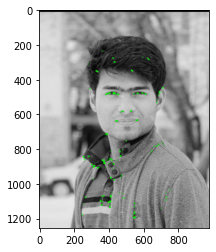

The Number of keypoints in test Image : 500


In [19]:
import numpy as np#For faceimg1
import cv2 as cv
from matplotlib import pyplot as plt
Img_2= cv.imread('/content/feature_engineering/trunk/ICE_5/faceimg1_grey.jpeg',0)

orb= cv.ORB_create()

Img_kp= orb.detect(Img_2,None)

Img_kp, desc = orb.compute(Img_2, Img_kp)

kp_Img= cv.drawKeypoints(Img_2, Img_kp, None, color=(0,255,0), flags=0)
plt.imshow(kp_Img), plt.show()
print(f'The Number of keypoints in test Image : {len(test_keypoints)}')

## Question 3. Difference between MPEG 4 and MPEG 7 

**Answer to Q3**: type your answer here


## Question 4. 

Whats MPEG 21 ? 

Whats the Purpose of MPEG 21 ?

Applications of MPEG 21?

**Answer to Q4**: type your answer here